# Finite Element Method for Heat Equation 1D space and time

Solves the heat equation $ \frac{\partial \, u(x,t)}{\partial t}= \frac{\partial^2 \, u(x,t)}{\partial x^2} + f(x,t)$ on the domain $x \in \Omega=(0,1)$ and $t \in (0,T)$ supplied with boundary and initial conditions. For the discretization in space, the Galerkin finite element method is employed.

This notebook contains the configuration of coil in air with conductivity assumed to be one; 

This notebook ought to be extended with 
1. a reference solution for coil in air generated using e.g. the pdsolve-function of sympy; 
2. a configuration for coil-yoke-air assuming linear magnetic material (constant magnetic permeability) and assuming the yoke to be more conductive thaqt air and coil;
3. a configuration for coil-yoke-air assuming non-linear magnetic material (magnetic saturation); 

## Import Packages

In [1]:
using LinearAlgebra
using StructArrays
using StaticArrays
using DifferentialEquations
using Plots
using LaTeXStrings
using SparseArrays
using BenchmarkTools 

In [2]:
using Logging: global_logger
using TerminalLoggers: TerminalLogger
global_logger(TerminalLogger())

Logging.ConsoleLogger(IJulia.IJuliaStdio{Base.PipeEndpoint}(IOContext(Base.PipeEndpoint(RawFD(44) open, 0 bytes waiting))), Info, Logging.default_metafmt, true, 0, Dict{Any, Int64}())

## Section 1/: Introduction 
### Spatial Discretization using FEM 
After discretization in space, the system of ordinary differential equations to be solved can be written as
\begin{equation}
M \, \dot{\mathbf{u}}(t) = - A \, \mathbf{u}(t) + \mathbf{f}(t)
\end{equation}
where $M$, $A$ and $\mathbf{f}$ are the mass matrix, the stiffness matrix and the load vector, respectively. The minus sign in front of the matrix A comes from the fact that $+u_{xx}$ is discretized. The boundary conditions are incorporated in the matrix $A$ and *not* in the matrix $M$.

### Time Discretization using the Euler Backward Method 
Assume that the time interval $[0,T]$ is divided into $Nt$ time intervals of size $dt$ such that $Nt+1$ time samples $t_k = (k-1)dt$ arrise where $1 \leq k \leq Nt+1$. We in particular have that $t_1=0$ and $t_{Nt+1}=T$. Collocating the system of differential equations as $t_k$ where $1 \leq k \leq Nt+1$, we obtain 
\begin{equation}
M \, \dot{\mathbf{u}}(t_k) = - A \, \mathbf{u}(t_k) + \mathbf{f}(t_k)
\end{equation}
In view of applying a backward difference quotient, we restrict the $k$-range to $2 \leq k \leq Nt+1$ as in $k=1$ no backward difference quotient is possible. 
By a backward difference scheme, we obtain for $2 \leq k \leq Nt+1$
\begin{equation}
M \, \frac{ \mathbf{u}(t_k) - \mathbf{u}(t_{k-1})}{dt} = - A \, \mathbf{u}(t_k) + \mathbf{f}(t_k)
\end{equation}
Therefore 
\begin{equation}
( M + dt \, A )\, \mathbf{u}(t_k) = M \, \mathbf{u}(t_{k-1}) + dt \, \mathbf{f}(t_k)
\end{equation}
or 
\begin{eqnarray}
\mathbf{u}(t_1) & = & u_0(x) \\ 
\mathbf{u}(t_k) & = & ( M + dt \, A )^{-1} \big{(} M \, \mathbf{u}(t_{k-1}) + dt \, \mathbf{f}(t_k) \big{)} \text{ for } 2 \leq k \leq Nt+1 
\end{eqnarray}

### Time Discretization using the Euler Forward Method 
In view of applying a forward difference quotient, we restrict the $k$-range to $1 \leq k \leq Nt$ as in $k=Nt+1$ no forward difference quotient is possible.
By a backward difference scheme, we obtain for $1 \leq k \leq Nt$
\begin{equation}
M \, \frac{ \mathbf{u}(t_{k+1}) - \mathbf{u}(t_k)}{dt} = - A \, \mathbf{u}(t_k) + \mathbf{f}(t_k)
\end{equation}
Therefore 
\begin{equation}
M \, \mathbf{u}(t_{k+1}) = M \, \mathbf{u}(t_k) - dt \, A \, \mathbf{u}(t_k) + dt \, \mathbf{f}(t_k)
\end{equation}
or 
\begin{eqnarray}
\mathbf{u}(t_1)     & = & u_0(x) \\ 
\mathbf{u}(t_{k+1}) & = & \mathbf{u}(t_k) + dt \, M^{-1} \, \big{(} - A \, \mathbf{u}(t_k) + \mathbf{f}(t_k) \big{)} \text{ for } 1 \leq k \leq Nt  
\end{eqnarray}


## Section 2:/ Spatial Discretization using FEM
Here we construct the stiffness matrix $A$, the mass matrix $M$ and the load vector $f$. 

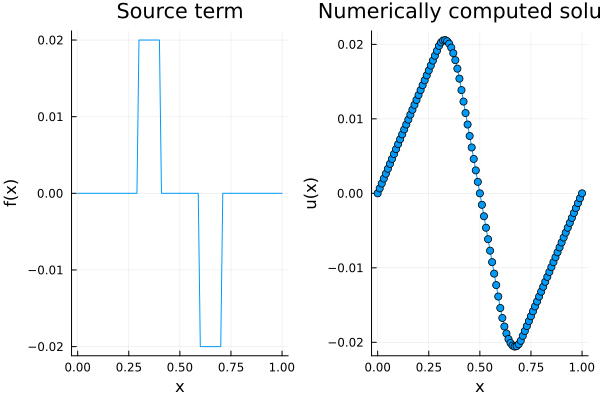

In [3]:
#..construct the mesh: see before 
N = 100; Np1 = N+1; h = 1/N
x = Vector(0:h:1) 

#..Mesh with points and edges 
#..point holds the coordinates of the left and right node of the element
#..edges holds the global indices of the left and right node of the element
points = collect( [x[i], x[i+1]] for i in 1:N) 
edges = collect( [i, i+1] for i in 1:N) 

#..Set the source function 
fsource(x) = (x>=.3)*(x<=.4) - (x>=.6)*(x<=.7)  

#..Initialize global matrix and right-hand side value 
floc = zeros(Float64,2, 1)
Aloc = zeros(Float64,2,2)
Mloc = zeros(Float64,2,2)
A = zeros(Float64,length(x), length(x))
M = zeros(Float64,length(x), length(x))
f = zeros(Float64,length(x), 1)

#..Perform loop over elements and assemble global matrix and vector 
for i=1:N 

  xl, xr = points[i,:][1]
  floc = (xr-xl) * [fsource(xl), fsource(xr)]
  Aloc = (1/(xr-xl))*[1 -1; -1 1]
  Mloc = (xr-xl)/2*[1 0; 0 1]    
  f[edges[i]] += floc
  A[edges[i], edges[i]] += Aloc
  M[edges[i], edges[i]] += Mloc

end

#..handle the boundary conditions in the matrix and right-hand side vector 
A[1,1] = 1;     A[1,2] = 0;        f[1]   = 0
A[end,end-1]=0; A[end,end] = 1;    f[end] = 0

#..Convert A and M to sparse format 
A = sparse(A)
M = Diagonal(M)

#..solve the linear system
u = A \ f

#..plot the solution 
p1=plot(x,f,legend=false)
xlabel!("x") 
ylabel!("f(x)")
title!("Source term")
p2=plot(x,u,shape=:circle,legend=false)
xlabel!("x") 
ylabel!("u(x)")
title!("Numerically computed solution")
plot(p1,p2,layout=(1,2))

## Section 3:/ Time Signal 
For future reference, we here plot a typical time trace of the excitation. 

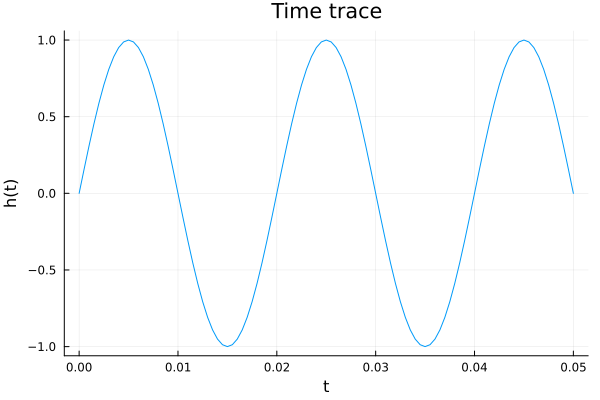

In [4]:
t0 = 0.0
tf = 50e-3 
Nt = 100 
dt = (tf - t0)/Nt 

tvec = Vector(t0:dt:tf)
hh(t) = sin(2*π*50*t)
hvec = hh.(tvec)

plot(tvec, hvec,legend=false)
xlabel!("t") 
ylabel!("h(t)")
title!("Time trace")

## Section 4:/ The Case $f(x,t)=0$ with Analytical Solution 

### Section 1.4:/ Hand-Coded Euler Backward  
\begin{eqnarray}
\mathbf{u}(t_1) & = & u_0(x) \\ 
\mathbf{u}(t_k) & = & ( M + dt \, A )^{-1} \big{(} M \, \mathbf{u}(t_{k-1}) + dt \, \mathbf{f}(t_k) \big{)} \text{ for } 2 \leq k \leq Nt+1 
\end{eqnarray}

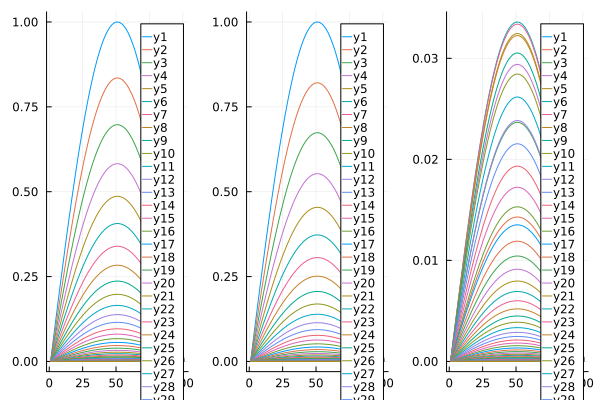

In [5]:
# define reference analytical solutions 
uanal1(x,t) = sin(π*x)*exp(-π^2*t)
uanal3(x,t) = sin(3*π*x)*exp(-(3*π)^2*t)
uanal5(x,t) = sin(5*π*x)*exp(-(5*π)^2*t)

# set time interval and time step 
t0 = 0.0
tf = 2.0
Nt = 100 
dt = (tf - t0)/Nt 
# Vector t holds 0 and is Nt+1 long 
t  = Vector(t0:dt:Nt*dt)

# set array of analytical solution
Uanal = [uanal1(xi,tj) for xi in x, tj in t]

# set initial guess 
u0 = fill(0.,Np1)
u0[45:55] .= 1. 
#u0 = sin.(π*x)

# initialize solution array and set initial guess
myU      = zeros(Np1,Nt+1)
myU[:,1] = u0; 
myU[:,1] = [uanal1(xi,tj) for xi in x, tj in [0]] 

# perform time integration using backward Euler   
for k = 2:Nt+1
    myU[:,k] = (M+dt*A) \ (M*myU[:,k-1])
end 

p1 = plot(myU)
p2 = plot(Uanal)
p3 = plot(myU - Uanal)
plot(p1,p2,p3, layout = (1,3))

### Section 2.4:/ Hand-Coded Euler Forward 
\begin{eqnarray}
\mathbf{u}(t_1)     & = & u_0(x) \\ 
\mathbf{u}(t_{k+1}) & = & \mathbf{u}(t_k) + dt \, M^{-1} \, \big{(} - A \, \mathbf{u}(t_k) + \mathbf{f}(t_k) \big{)} \text{ for } 1 \leq k \leq Nt  
\end{eqnarray}

In [6]:
# define reference analytical solutions 
uanal1(x,t) = sin(π*x)*exp(-π^2*t)
uanal3(x,t) = sin(3*π*x)*exp(-(3*π)^2*t)
uanal5(x,t) = sin(5*π*x)*exp(-(5*π)^2*t)

# set time interval and time step 
t0 = 0.0
tf = 0.02
Nt = 1000
dt = (tf - t0)/Nt 
# Vector t holds 0 and is Nt+1 long 
t  = Vector(t0:dt:Nt*dt)

# set array of analytical solution
Uanal = [uanal1(xi,tj) for xi in x, tj in t]

# set initial guess 
u0 = fill(0.,Np1)
u0[45:55] .= 1. 
#u0 = sin.(π*x)

# initialize solution array and set initial guess
myU      = zeros(Np1,Nt+1)
myU[:,1] = u0; 
myU[:,1] = [uanal1(xi,tj) for xi in x, tj in [0]] 

# perform time integration using forward Euler   
for k = 1:Nt
    myU[:,k+1] = myU[:,k] + dt * (M \ (-A*myU[:,k]))
end 

p1 = plot(myU)
plot(p1)
p2 = plot(Uanal)
p3 = plot(myU - Uanal)
plot(p1,p2,p3, layout = (1,3))

## Section 3.4:/ Using DifferentialEquations.jl 

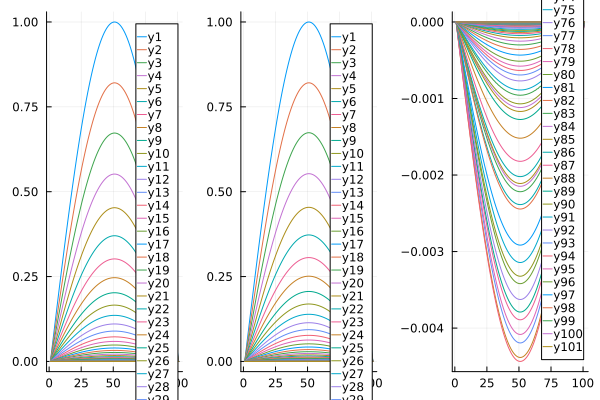

In [7]:
# define reference analytical solutions 
uanal1(x,t) = sin(π*x)*exp(-π^2*t)
uanal3(x,t) = sin(3*π*x)*exp(-(3*π)^2*t)
uanal5(x,t) = sin(5*π*x)*exp(-(5*π)^2*t)

# set time interval and time step 
t0 = 0.0
tf = 2.0
Nt = 100 
dt = (tf - t0)/Nt 
# Vector t holds 0 and is Nt+1 long 
tvec = Vector(t0:dt:Nt*dt)

# set array of analytical solution
Uanal = [uanal1(xi,tj) for xi in x, tj in tvec]

#..define the right-hand side of the ordinary differential equation of the equation of motion 
function scalarDiffusionEquation!(du,u,p,t)
    du[:] = - M\A*u
    du[1] = 0.
    du[end] = 0. 
end

#..set initial position and velocity
u0 = [uanal1(xi,tj) for xi in x, tj in [0]]
                                    
#..set time begin and end forward
t0 = 0.0
tf = 2.0
tspan = (t0,tf)

#..define ODE problem to be solved  
prob_scalarDiffusion = ODEProblem(scalarDiffusionEquation!, u0, tspan)

#..solve ODE problem 
sol = DifferentialEquations.solve(prob_scalarDiffusion);

#..interpolate solution in desired time samples 
U = zeros(Np1,length(tvec))
for k=1:length(tvec) 
  U[:,k] = sol(tvec[k])
end 

p1 = plot(U)
p2 = plot(Uanal)
p3 = plot(U - Uanal)
plot(p1,p2,p3, layout = (1,3))

## Section 6:/ The full problem: Single Phase Coil in Air 

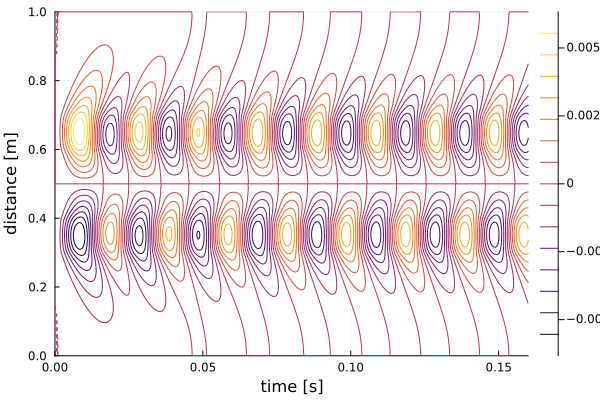

In [36]:
# set time interval and time step 
t0 = 0.0
tf = 8*0.02 
Nt = 8*100 
dt = (tf - t0)/Nt 
# Vector t holds 0 and is Nt+1 long 
tvec = Vector(t0:dt:Nt*dt)

#..define the right-hand side of the ordinary differential equation of the equation of motion 
function scalarDiffusionEquation!(du,u,p,t)
    du[:] = M\(-A*u - f*sin(2*π*50*t)) 
    du[1] = 0.
    du[end] = 0. 
end

#..set initial position and velocity
u0 = fill(0.,Np1)
                                    
#..set time begin and end forward
tspan = (t0,tf)

#..define ODE problem to be solved  
prob_scalarDiffusion = ODEProblem(scalarDiffusionEquation!, u0, tspan)

#..solve ODE problem 
#sol = DifferentialEquations.solve(prob_scalarDiffusion, Tsit5(), reltol = 1e-8, abstol = 1e-8,
#                                  progress = true, progress_steps = 1);
sol = DifferentialEquations.solve(prob_scalarDiffusion, Tsit5(), reltol = 1e-8, abstol = 1e-8);

#..interpolate solution in desired time samples
U = zeros(Np1,length(tvec))
for k=1:length(tvec) 
  U[:,k] = sol(tvec[k])
end 

contour(tvec,x,U)
xlabel!("time [s]")
ylabel!("distance [m]")

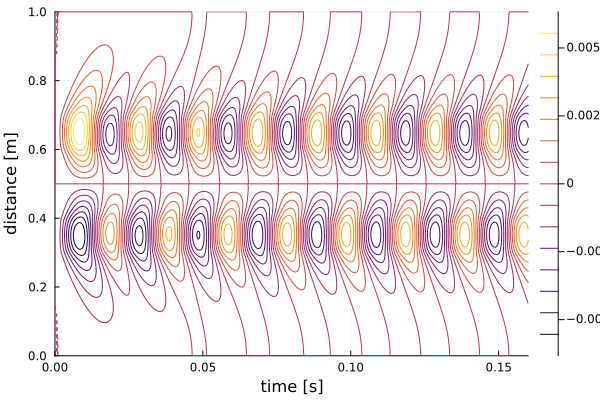

In [38]:
contour(tvec,x,U)
xlabel!("time [s]")
ylabel!("distance [m]")

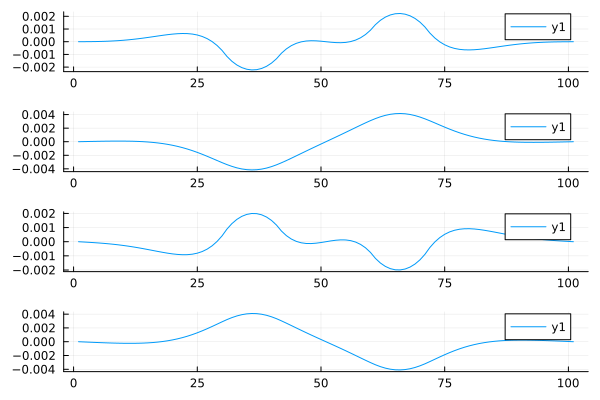

In [37]:
p1 = plot(U[:,326])
p2 = plot(U[:,351])
p3 = plot(U[:,376])
p4 = plot(U[:,400])
plot(p1,p2,p3,p4,layout=(4,1))